<a href="https://colab.research.google.com/github/rodirk/spezielle_bioinfo_2_22/blob/main/Spezielle_bioinformatik_II_image_basic_markus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import 

In [3]:
!pip install ipympl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 510 kB 8.5 MB/s 
     |████████████████████████████████| 11.2 MB 47.3 MB/s 
     |████████████████████████████████| 1.6 MB 45.0 MB/s 
     |████████████████████████████████| 965 kB 65.3 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import skimage.color
import skimage.draw
import skimage.filters
import ipympl

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
from google.colab import output
output.enable_custom_widget_manager()

In [4]:
%matplotlib widget

In [6]:
def plot(img, cmap="gray"):
  fig,ax = plt.subplots()
  plt.imshow(img, cmap=cmap) 

### Image Basics

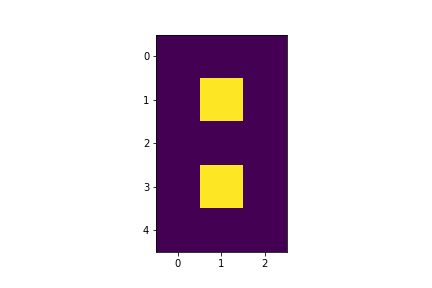

In [ ]:
#load image

image = skimage.io.imread(fname="/content/drive/MyDrive/data/eight.tif")
plt.imshow(image)

In [ ]:
print(image.shape)
print(image)

(5, 3)
[[0. 0. 0.]
 [0. 1. 0.]
 [0. 0. 0.]
 [0. 1. 0.]
 [0. 0. 0.]]


[[0. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 0. 0.]]


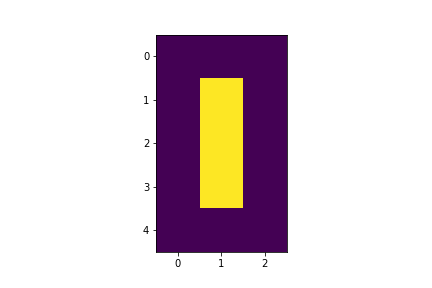

In [ ]:
#Manipulate Array

zero = skimage.io.imread(fname="/content/drive/MyDrive/data/eight.tif")
zero[2,1]=1.0

#plot in a new interactive figure
fig,ax =plt.subplots()
plt.imshow(zero)
print(zero)

[[0. 0. 0.]
 [0. 1. 1.]
 [0. 0. 0.]
 [1. 1. 0.]
 [0. 0. 0.]]


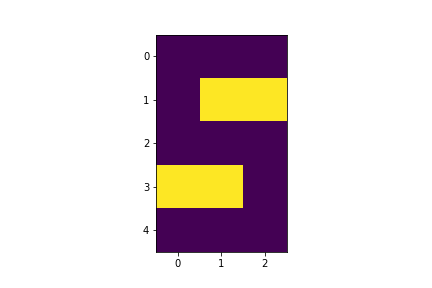

In [ ]:
#Aufgabe 1: Mache aus der 8 eine 5

five = skimage.io.imread(fname="/content/drive/MyDrive/data/eight.tif")
five[1,2] = 1.0
five[3,0] = 1.0

fig,ax =plt.subplots()
plt.imshow(five)
print(five)

### Colors

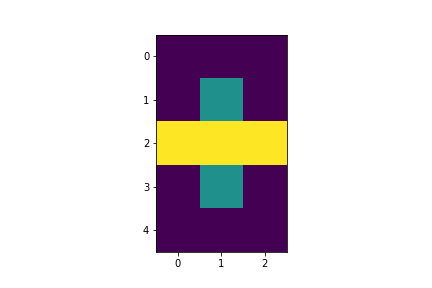

In [ ]:
drei_farben =skimage.io.imread(fname="/content/drive/MyDrive/data/eight.tif")

#Gesamtes Array it 128 multiplizieren
drei_farben = drei_farben * 128

#mittlere reihe auf 255 setzen

drei_farben[2,:] = 255


fig,ax =plt.subplots()
plt.imshow(drei_farben)

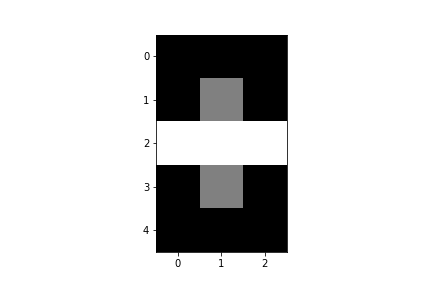

In [ ]:
#Bild in Graustufen anzeigen lassen

fig,ax =plt.subplots()
plt.imshow(drei_farben, cmap=plt.cm.gray)

[[[125 220 173]
  [112 177 241]
  [240 183  88]
  [ 18  24 144]]

 [[ 53  41  33]
  [ 27  11 147]
  [126  94 232]
  [203  48 147]]

 [[166  72 142]
  [ 93  16 250]
  [218 139 222]
  [ 97 130 208]]

 [[245  15 151]
  [229  81  87]
  [213 165 244]
  [184 242 122]]]


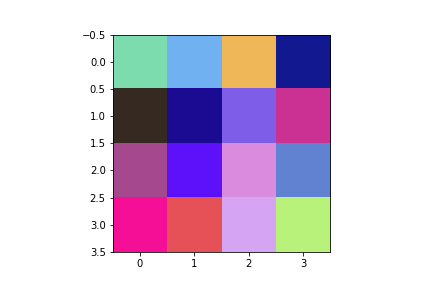

In [ ]:
#Seed setzen

pseudorandom = np.random.RandomState(2022)

#4x4 matrix mit drei dimensionen erstellen
checkerboard = pseudorandom.randint(0,255, size=(4,4,3))

#plotten
fig,ax =plt.subplots()
plt.imshow(checkerboard)

#zeig arrays
print(checkerboard)

In [ ]:
#infos rechts oben pixel
pixel_ro = checkerboard[1,3,:]
pixel_ro

array([203,  48, 147])

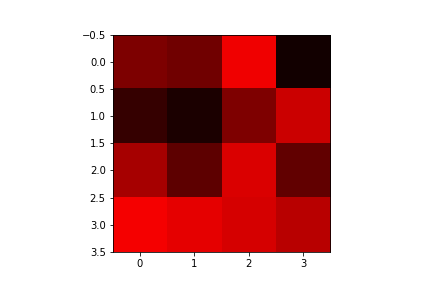

In [ ]:
#Channel einzeln ansehen'

red_channel = checkerboard * [1,0,0]

#plotten
fig,ax =plt.subplots()
plt.imshow(red_channel)

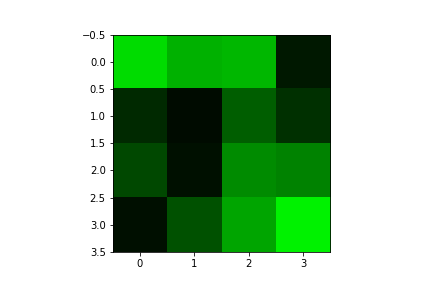

In [ ]:
green_channel = checkerboard * [0,1,0]

#plotten
fig,ax =plt.subplots()
plt.imshow(green_channel)

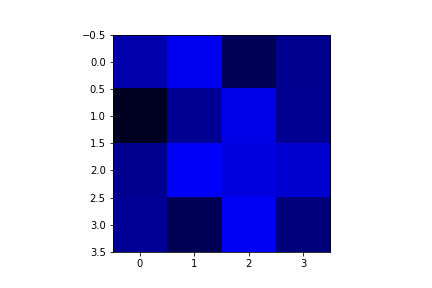

In [ ]:
blue_channel = checkerboard * [0,0,1]

#plotten
fig,ax =plt.subplots()
plt.imshow(blue_channel)

### Lesson 2: Working with skimage

Aufgabe: Schreibt eine Funktion, die das Plotten der Bilder vereinfacht.

In [6]:
def plot(img):
  fig,ax =plt.subplots()
  plt.imshow(img) 

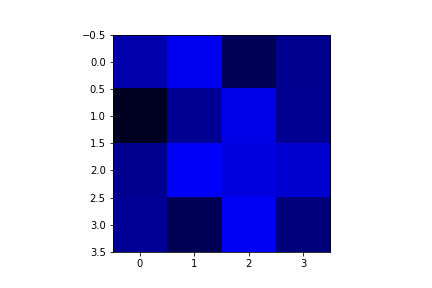

In [ ]:
plot(blue_channel)

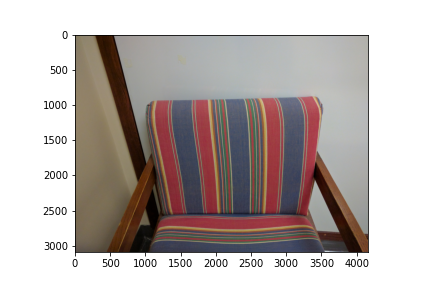

In [ ]:
#Laden des Stuhlbildes
image =skimage.io.imread("/content/drive/MyDrive/data/chair.jpg")

plot(image)

In [ ]:
#speichern als Tiff

skimage.io.imsave("/content/drive/MyDrive/data/chair.tif", arr=image2)

In [ ]:
import skimage.transform

In [ ]:
#Verkleinern des Bildes auf 10% der Größe

new_shape = (image.shape[0] // 10, image.shape[1] // 10, image.shape[2])

small = skimage.transform.resize(image=image, output_shape=new_shape)
small = skimage.img_as_ubyte(small)

new_shape

(308, 416, 3)

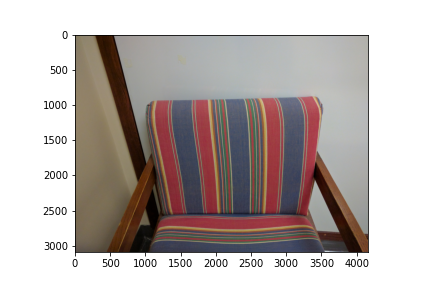

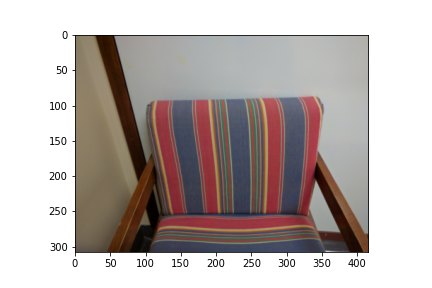

In [ ]:
# Lösung der Aufgabe "Bild laden, Größe auf 10%, Bild speichern als Tif, Bild + kleines Bild Plotten":

# Laden des Bildes

image =skimage.io.imread("/content/drive/MyDrive/data/chair.jpg")

# Bild auf 10% der Größe verkleinern 

new_shape = (image.shape[0] // 10, image.shape[1] // 10, image.shape[2])

small = skimage.transform.resize(image=image, output_shape=new_shape)
small = skimage.img_as_ubyte(small)

#Bild speichern als Tif

skimage.io.imsave("/content/drive/MyDrive/data/chair_small.tif", arr=small)

#Original + Small plotten

plot(image)
plot(small)



### Pixel manipulieren 

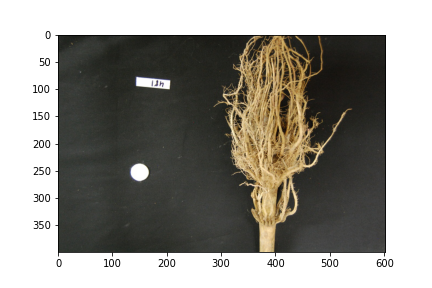

In [ ]:
#read image
root = skimage.io.imread("/content/drive/MyDrive/data/maize-root-cluster.jpg")

plot(root)

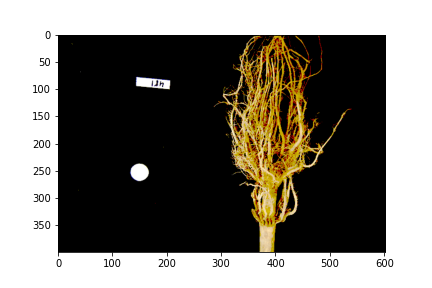

In [ ]:
#nur hohe intensitäten behalten
root[root <128] = 0

plot(root)

### Konvertierung zu Grayscale Bildern 

In [ ]:
import skimage.color

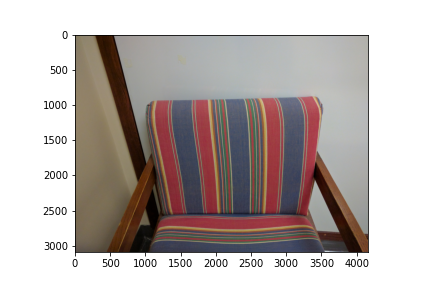

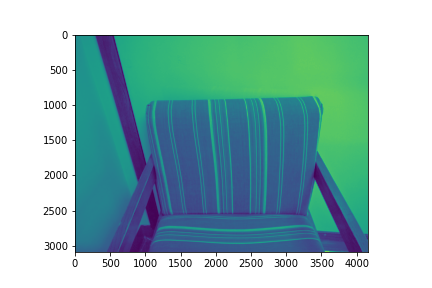

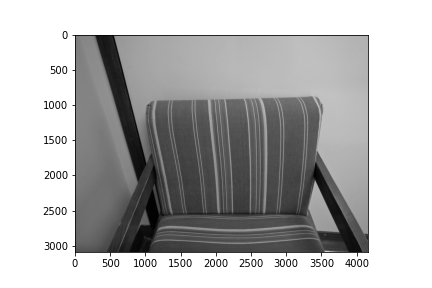

In [ ]:
#Bild laden
image =skimage.io.imread("/content/drive/MyDrive/data/chair.jpg")

plot(image)


#Konvertieren zu Grayscale

gray_image = skimage.color.rgb2gray(image)
plot(gray_image)


fig,ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

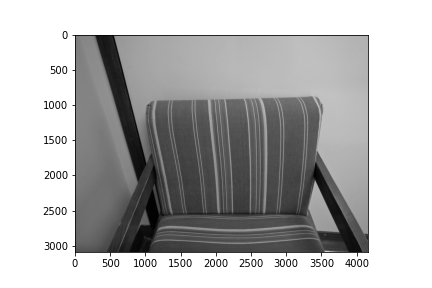

In [ ]:
#Bild laden
image2 =skimage.io.imread(fname="/content/drive/MyDrive/data/chair.jpg", as_gray=True)

fig,ax = plt.subplots()
plt.imshow(image2, cmap="gray")

### Bildausschnitte via Array-Slicing

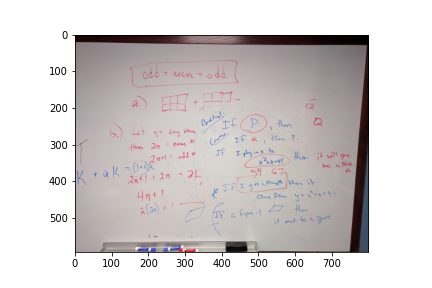

In [ ]:
# Bild laden 

board =skimage.io.imread(fname="/content/drive/MyDrive/data/board.jpg")

plot(board)

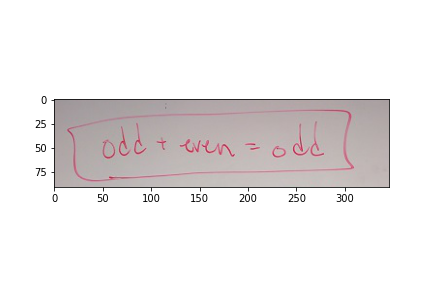

In [ ]:
#ausschnitt des Bildbereichs
clip = board[60:151, 135:481, :]
plot(clip)

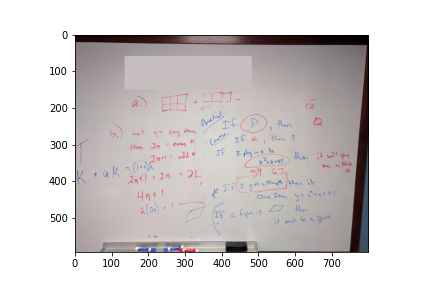

In [ ]:
#farbe ersetzten im originalbild

color = board[330, 90]
board[60:151, 135:481] = color

plot(board)

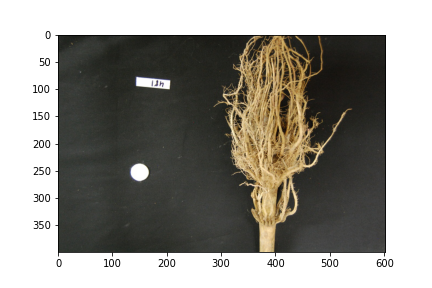

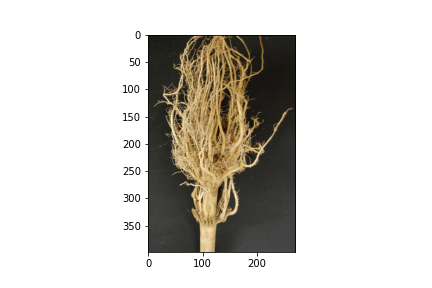

In [ ]:
### Aufgabe: Schneide die Wurzel aus und Plotte sie

#read image
root = skimage.io.imread("/content/drive/MyDrive/data/maize-root-cluster.jpg")

plot(root)


#ausschneiden und plotten:

clip = root[1:400, 275:545, :]
plot(clip)

## Tag 2

### Drawing

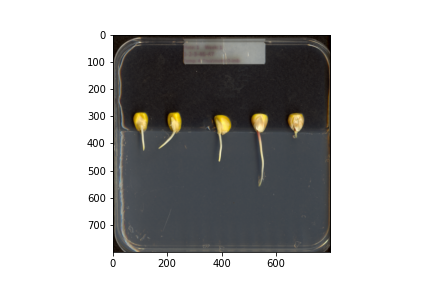

In [7]:
image = skimage.io.imread("/content/drive/MyDrive/data/maize-seedlings.tif")
plot(image)

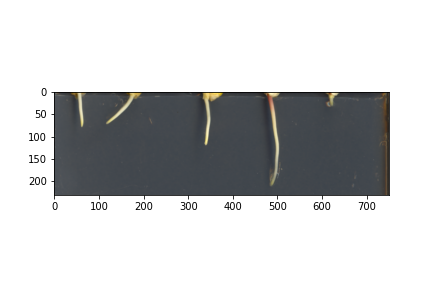

In [10]:
# Aufgabe: Schneide mittels "slicing" den unteren Bereich des Bildes (mit den Wurzeln) aus

clip = image[350:580, 50:, :]
plot(clip)

In [11]:
import skimage.draw

In [15]:
mask = np.ones(shape=image.shape[0:2], dtype="bool")

In [16]:
rr, cc = skimage.draw.rectangle(start=(360,72), end=(600,755))

In [19]:
mask[rr, cc] = False

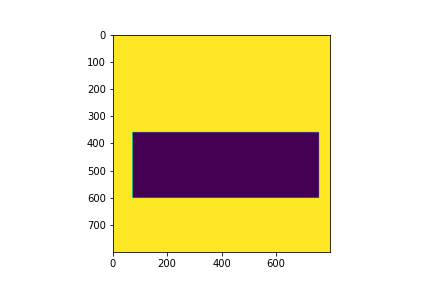

In [20]:
plot(mask)

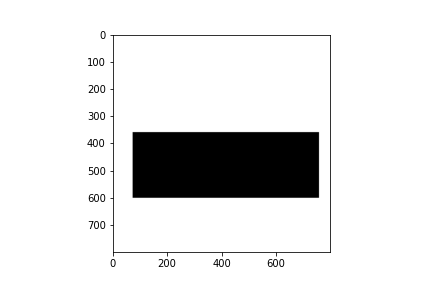

In [29]:
plot(mask)

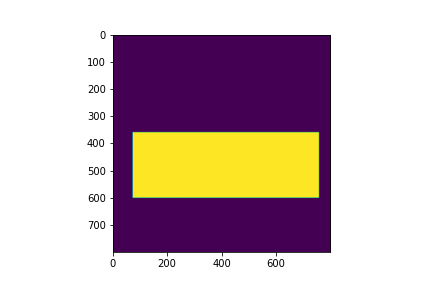

In [33]:
plot(mask, cmap="viridis_r")

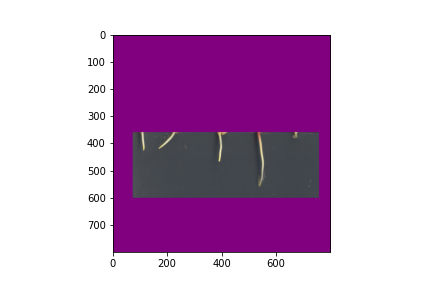

In [39]:
image[mask] = [128, 0, 128]
plot(image)

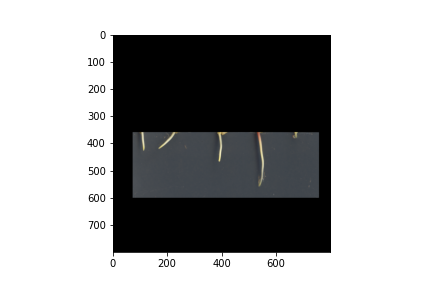

In [41]:
image[mask] = 0
plot(image)

In [35]:
mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [36]:
image.shape

(800, 800, 3)

In [37]:
mask.shape

(800, 800)

#### Practice Drawing

In [45]:
# erstelle schwarze Seite
image = np.zeros(shape=(600, 800, 3), dtype="uint8")

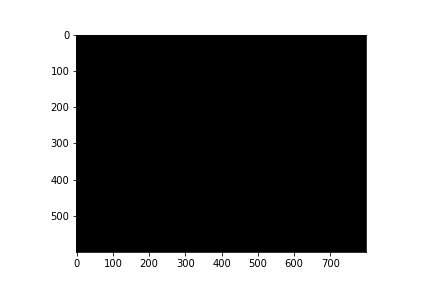

In [43]:
plot(image)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


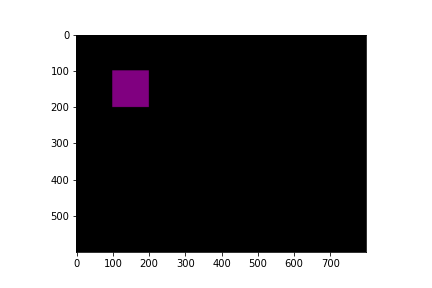

In [46]:
rr, cc = skimage.draw.rectangle(start=(100,100), end=(200,200))
image[rr,cc] = [128,0,128]
plot(image)

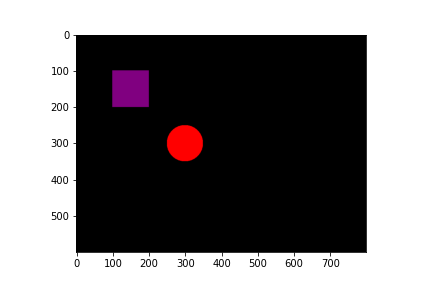

In [47]:
rr, cc = skimage.draw.disk(center=(300,300), radius=50)
image[rr, cc] = [255,0,0]
plot(image)

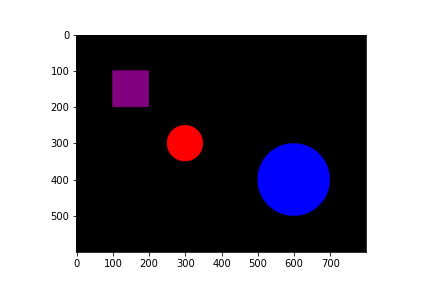

In [48]:
rr, cc = skimage.draw.disk(center=(400,600), radius=100)
image[rr, cc] = [0,0,255]
plot(image)

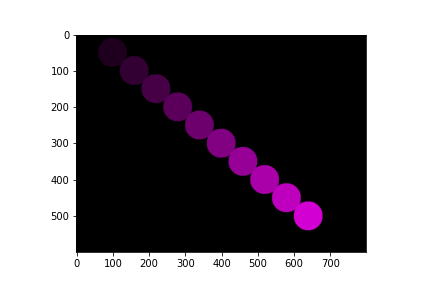

In [50]:
image = np.zeros(shape=(600,800,3), dtype="uint8")

for i in range(10):
  rr, cc = skimage.draw.disk(center=(50+50*i, 100+60*i), radius=40)
  image[rr,cc] = [30+20*i,0,30+20*i]

plot(image)

#### Anwendungsfall

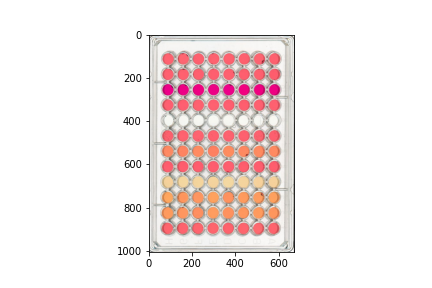

In [51]:
image = skimage.io.imread("/content/drive/MyDrive/data/wellplate-01.jpg")
plot(image)

In [53]:
mask = np.ones(shape=image.shape[0:2], dtype="bool")
rr, cc = skimage.draw.disk(center=(119,91), radius=20)
mask[rr,cc] = False
rr, cc = skimage.draw.disk(center=(542,368), radius=20)
mask[rr,cc] = False

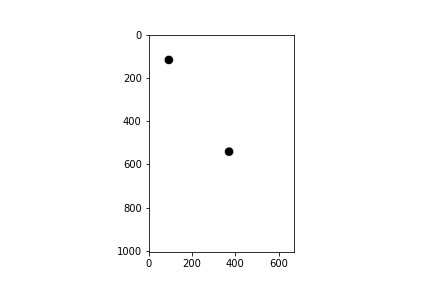

In [54]:
plot(mask)

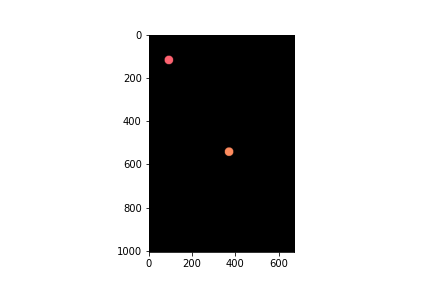

In [55]:
image[mask] = 0
plot(image)

In [56]:
centers = np.loadtxt("/content/drive/MyDrive/data/centers.txt")

In [58]:
centers.shape

(96, 2)

In [65]:
for center in centers:
  print(center[1])

91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0
91.0
161.0
231.0
301.0
371.0
441.0
511.0
581.0


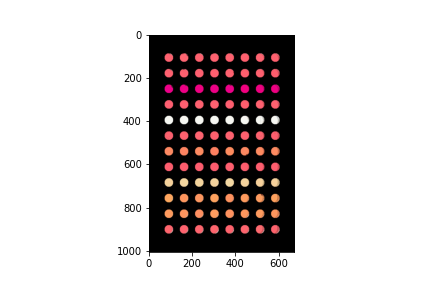

In [66]:
image = skimage.io.imread("/content/drive/MyDrive/data/wellplate-01.jpg")
mask = np.ones(shape=image.shape[0:2], dtype="bool")

for center in centers:
  # Ersetze das print durch mehrere Zeilen, in denen die Maske um eine Disk mit Radius 20 erweitert wird
  #print("Aktuelles Zentrum: x=", center[0], ", y=", center[1])
  rr, cc = skimage.draw.disk(center=(center[1],center[0]), radius=20)
  mask[rr,cc] = False

image[mask] = 0
plot(image)

In [71]:
image = skimage.io.imread("/content/drive/MyDrive/data/wellplate-01.jpg")

for center in centers:
  # Ersetze das print durch mehrere Zeilen, in denen die Maske um eine Disk mit Radius 20 erweitert wird
  #print("Aktuelles Zentrum: x=", center[0], ", y=", center[1])
  rr, cc = skimage.draw.disk(center=(center[1],center[0]), radius=20)
  print(center, image[rr,cc].mean(axis=0))

[ 91. 108.] [249.5253012   98.82008032 112.3253012 ]
[161. 108.] [246.17429719  99.1373494  111.25140562]
[231. 108.] [251.10441767  98.73574297 112.19678715]
[301. 108.] [249.88433735  97.79277108 111.16947791]
[371. 108.] [251.63373494  98.23453815 111.26666667]
[441. 108.] [251.38875502  96.85461847 110.51566265]
[511. 108.] [247.31164659  98.81686747 111.44658635]
[581. 108.] [245.88273092  95.60160643 108.55903614]
[ 91. 180.] [248.99839357  97.02971888 111.14779116]
[161. 180.] [247.58232932  95.48835341 109.68032129]
[231. 180.] [251.81927711  95.68674699 111.06425703]
[301. 180.] [251.97590361  95.5815261  111.02168675]
[371. 180.] [251.16947791  96.44578313 110.79598394]
[441. 180.] [249.84738956  94.71164659 109.62409639]
[511. 180.] [247.52048193  94.98714859 108.94538153]
[581. 180.] [244.13172691  91.6811245  106.5502008 ]
[ 91. 252.] [230.95742972   2.62971888 132.99518072]
[161. 252.] [232.16144578   1.83373494 130.17429719]
[231. 252.] [238.38875502   1.42168675 129.231

### Histograms

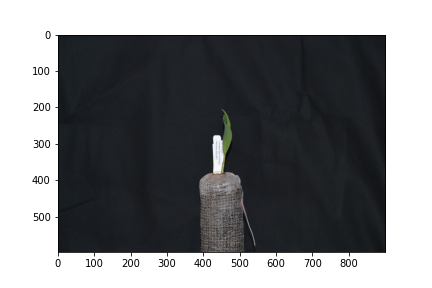

In [76]:
image = skimage.io.imread("/content/drive/MyDrive/data/plant-seedling.jpg")
plot(image)

In [77]:
gray_image = skimage.color.rgb2gray(image)

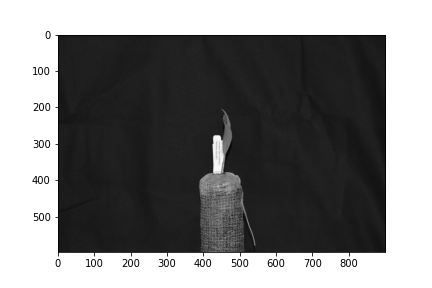

In [78]:
plot(gray_image)

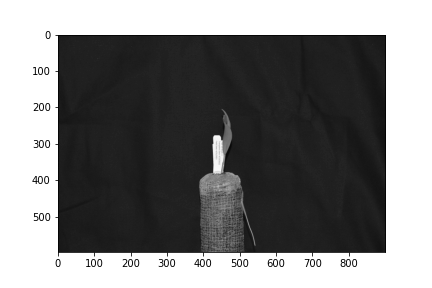

In [81]:
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray", vmin=0, vmax=1)

In [1]:
histogram, bin_edges = np.histogram(gray_image, bins=256, range=(0,1))

NameError: ignored

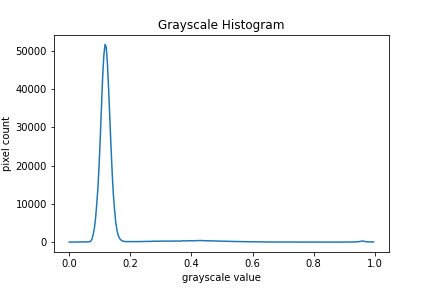

In [86]:
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("grayscale value")
plt.ylabel("pixel count")
plt.plot(bin_edges[0:-1], histogram)

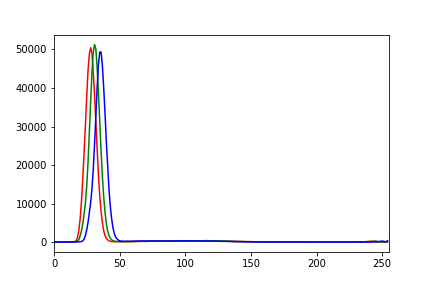

In [90]:
plt.figure()
plt.xlim([0,255])

colors = ["red", "green", "blue"]

for channel_index in range(3):
  histogram, bin_edges = np.histogram(image[:,:,channel_index], bins=256, range=(0,255))
  plt.plot(bin_edges[0:-1], histogram, c=colors[channel_index])

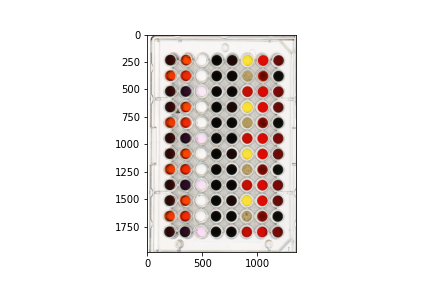

In [7]:
image = skimage.io.imread("/content/drive/MyDrive/data/wellplate-02.tif")
plot(image)

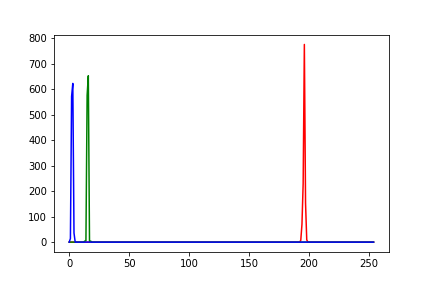

In [10]:
# Aufgabe: Wähle einen beliebigen Well aus und berechne das Histogram über dessen Pixelwerte (mit rot, grün und blau Kanal)
# erstelle Disk für den gewählten Well
rr, cc = skimage.draw.disk(center=(956,915), radius=20)
# selektiere Pixel im Bild entsprechend der Disk
pixels = image[rr,cc]
# berechne Histogram der Pixelintensitäten für jeden der drei Farbkanäle und plotte dies
plt.figure()

colors = ["red", "green", "blue"]

for channel_index in range(3):
  histogram, bin_edges = np.histogram(pixels[:,channel_index], bins=256, range=(0,255))
  plt.plot(bin_edges[0:-1], histogram, c=colors[channel_index])

### Blurring

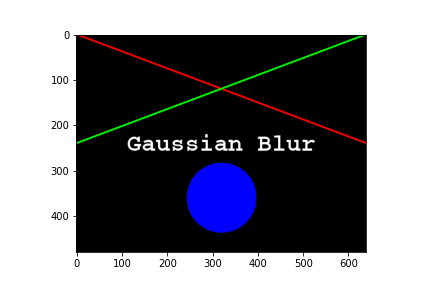

In [93]:
image = skimage.io.imread("/content/drive/MyDrive/data/gaussian-original.png")
plot(image)

In [94]:
import skimage.filters

In [98]:
blurred = skimage.filters.gaussian(image, sigma=3.0, multichannel=True)

In [99]:
import skimage
print(skimage.__version__)

0.18.3


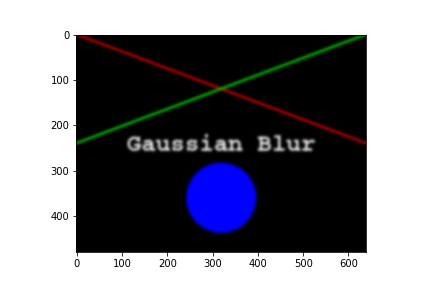

In [100]:
plot(blurred)

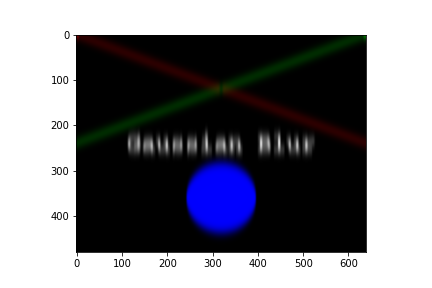

In [103]:
blurred = skimage.filters.gaussian(image, sigma=[10,1.0], multichannel=True)
plot(blurred)

### Thresholding

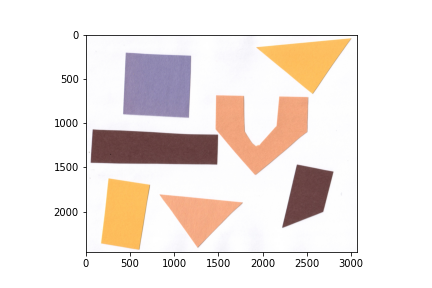

In [106]:
image = skimage.io.imread("/content/drive/MyDrive/data/shapes-01.jpg")
plot(image)

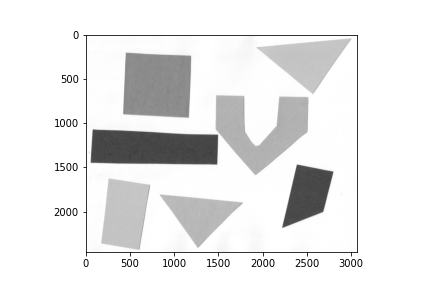

In [107]:
# convert to grayscale
gray_image = skimage.color.rgb2gray(image)

# blur the image to denoise
blurred_image = skimage.filters.gaussian(gray_image, sigma=1.0)

# look at the image
plot(blurred_image)

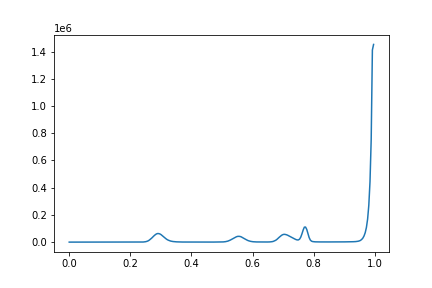

In [108]:
histogram, bin_edges = np.histogram(blurred_image, bins=256, range=(0.0,1.0))

plt.figure()
plt.plot(bin_edges[0:-1], histogram)

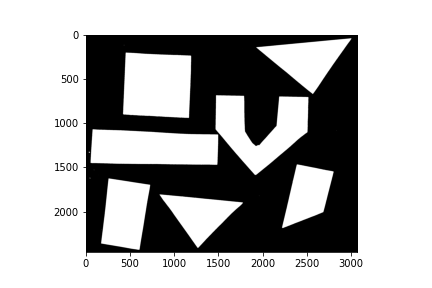

In [112]:
threshold = 0.9
binary_mask = blurred_image < threshold
plot(binary_mask)

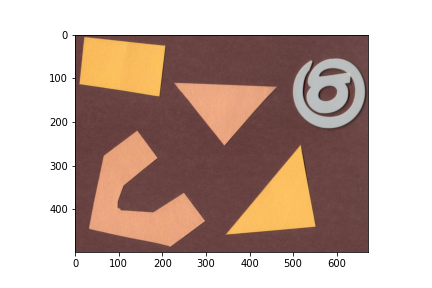

In [113]:
# Übung, das ganze nochmal mit shapes-02
image = skimage.io.imread("/content/drive/MyDrive/data/shapes-02.jpg")
plot(image)

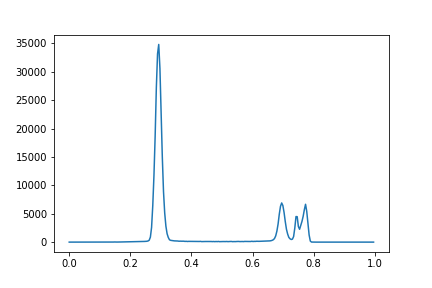

In [114]:
gray_image = skimage.color.rgb2gray(image)
blurred_image = skimage.filters.gaussian(gray_image, sigma = 1.0)
histogram, bin_edges = np.histogram(blurred_image, bins=256, range=(0.0,1.0))

plt.figure()
plt.plot(bin_edges[0:-1], histogram)

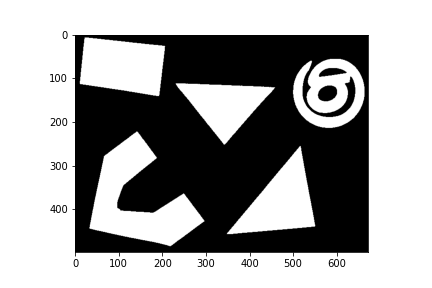

In [116]:
threshold = 0.6
binary_mask = blurred_image>threshold
plot(binary_mask)

In [119]:
~np.array([True, False, True])

array([False,  True, False])

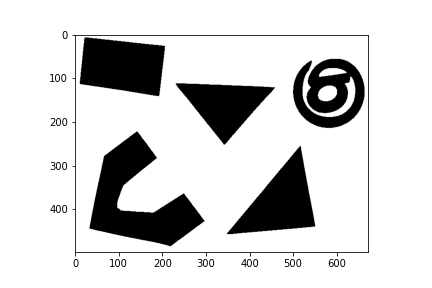

In [120]:
plot(~binary_mask)

#### Automatic thresholding

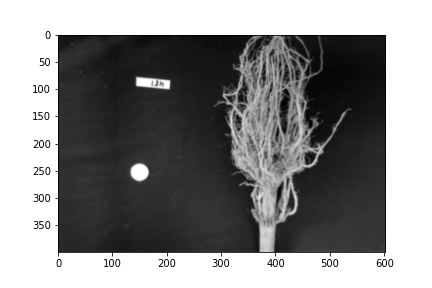

In [121]:
gray_image = skimage.io.imread("/content/drive/MyDrive/data/maize-root-cluster.jpg", as_gray=True)
blurred_image = skimage.filters.gaussian(gray_image, sigma=1.0)
plot(blurred_image)

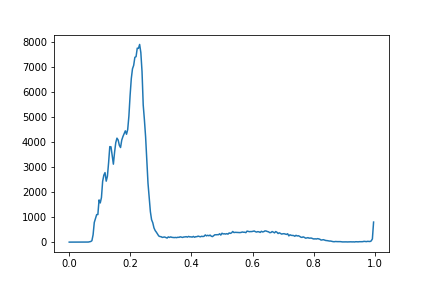

In [122]:
histogram, bin_edges = np.histogram(blurred_image, bins=256, range=(0.0,1.0))
plt.figure()
plt.plot(bin_edges[0:-1], histogram)

In [124]:
threshold = skimage.filters.threshold_otsu(blurred_image)
print(threshold)

0.4113342270063075


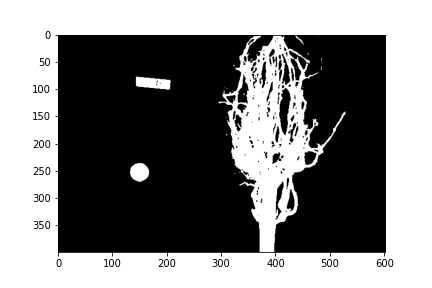

In [125]:
binary_mask = blurred_image > threshold
plot(binary_mask)

In [127]:
np.sum(binary_mask) / (400*600)

0.14504583333333335

In [147]:
def measure_root_mass(filename, sigma=1.0):
  # read image and convert to grayscale
  gray_image = skimage.io.imread(filename, as_gray=True)
  # denoise image
  blurred_image = skimage.filters.gaussian(gray_image, sigma=sigma)
  # get automatic threshold
  threshold = skimage.filters.threshold_otsu(blurred_image)
  # print(threshold)
  # create binary mask
  binary_mask = blurred_image > threshold
  # return fraction of white pixels in mask
  return np.sum(binary_mask) / (binary_mask.shape[1]*binary_mask.shape[0])

In [148]:
measure_root_mass("/content/drive/MyDrive/data/maize-root-cluster.jpg", sigma=1.0) # returns 0.14504583333333335

0.1445639534883721

In [149]:
measure_root_mass("/content/drive/MyDrive/data/trial-016.jpg")

0.04653656914893617

In [150]:
import glob

In [152]:
trials = glob.glob("/content/drive/MyDrive/data/trial-*.jpg")

In [153]:
for trial in trials:
  print(trial, measure_root_mass(trial))

/content/drive/MyDrive/data/trial-216.jpg 0.1399512965425532
/content/drive/MyDrive/data/trial-293.jpg 0.1341205119680851
/content/drive/MyDrive/data/trial-016.jpg 0.04653656914893617
/content/drive/MyDrive/data/trial-020.jpg 0.06303823138297872


## Tag 3

### Connected Components

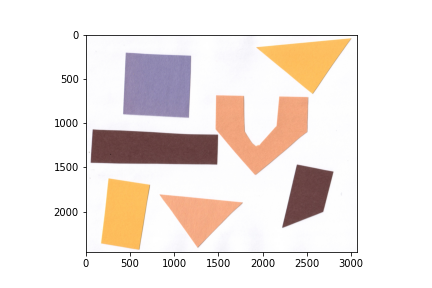

In [11]:
image = skimage.io.imread("/content/drive/MyDrive/data/shapes-01.jpg")
plot(image)

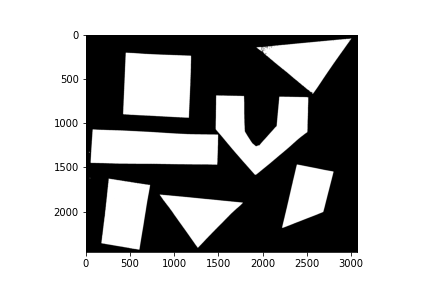

In [12]:
gray_image = skimage.color.rgb2gray(image)
blurred_image = skimage.filters.gaussian(gray_image, sigma=1.0)
threshold = 0.8
binary_mask = blurred_image < threshold
plot(binary_mask)

In [17]:
# Schreibe eine Funktion, die aus einem farbigen Bild und einem threshold eine binäre Maske macht
def image2mask(filename, threshold):
  image = skimage.io.imread(filename)
  gray_image = skimage.color.rgb2gray(image)
  blurred_image = skimage.filters.gaussian(gray_image, sigma=1.0)
  binary_mask = blurred_image < threshold
  #plot(binary_mask)
  return binary_mask

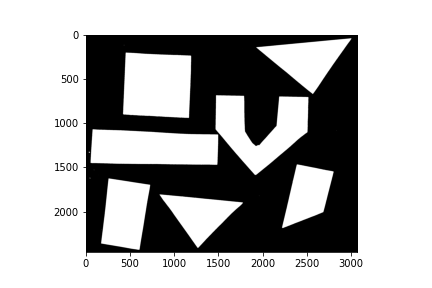

In [19]:
binary_mask = image2mask("/content/drive/MyDrive/data/shapes-01.jpg", 0.9)
plot(binary_mask)

In [20]:
import skimage.measure

In [21]:
labeled_image, count = skimage.measure.label(binary_mask, connectivity=2, return_num=True)

In [22]:
count

18

In [24]:
def get_random_point():
  x = 0
  y = 1
  return x,y

In [27]:
p = get_random_point()

In [28]:
p[0]

0

In [29]:
p[1]

1

In [30]:
u,v = get_random_point()

In [31]:
u

0

In [32]:
v

1

In [33]:
def connected_components(filename, sigma=1.0, threshold=0.5, connectivity=2):
  image = skimage.io.imread(filename)
  gray_image = skimage.color.rgb2gray(image)
  blurred_image = skimage.filters.gaussian(gray_image, sigma=sigma)
  binary_mask = blurred_image < threshold
  labeled_image, count = skimage.measure.label(binary_mask, connectivity=connectivity, return_num=True)
  return labeled_image, count

In [41]:
labeled_image, count = connected_components("/content/drive/MyDrive/data/shapes-01.jpg", sigma=1.0, threshold=0.9, connectivity=2)
print(count)

18


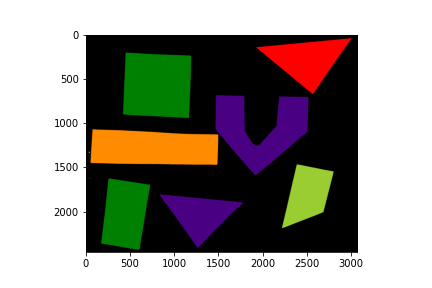

In [35]:
colored_label_image = skimage.color.label2rgb(labeled_image, bg_label=0)
plot(colored_label_image)

6


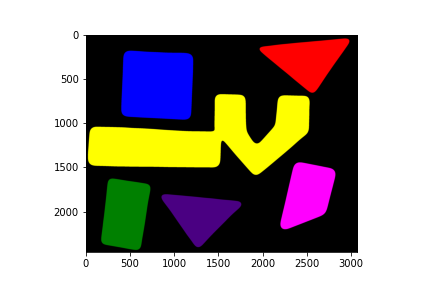

In [37]:
labeled_image, count = connected_components("/content/drive/MyDrive/data/shapes-01.jpg", sigma=30.0, threshold=0.9, connectivity=2)
print(count)
colored_label_image = skimage.color.label2rgb(labeled_image, bg_label=0)
plot(colored_label_image)

7


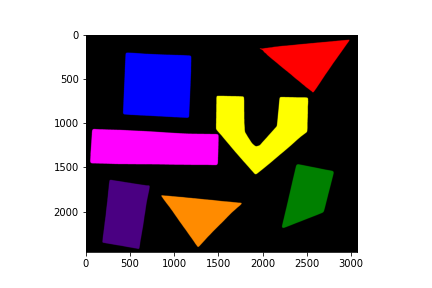

In [38]:
labeled_image, count = connected_components("/content/drive/MyDrive/data/shapes-01.jpg", sigma=10.0, threshold=0.8, connectivity=2)
print(count)
colored_label_image = skimage.color.label2rgb(labeled_image, bg_label=0)
plot(colored_label_image)

### Morphometrics

In [42]:
labeled_image, count = connected_components("/content/drive/MyDrive/data/shapes-01.jpg", sigma=1.0, threshold=0.9, connectivity=2)
print(count)

18


In [43]:
object_features = skimage.measure.regionprops(labeled_image)

In [44]:
object_features

In [47]:
object_features[1]["area"]

15

In [49]:
[object_feature["area"] for object_feature in object_features]

[317791,
 15,
 1,
 5,
 521176,
 494812,
 514226,
 6,
 137,
 254452,
 16,
 1,
 1,
 57,
 338000,
 264906,
 8,
 7]

In [50]:
import skimage.morphology

In [51]:
?skimage.morphology.remove_small_objects

In [52]:
big_labeled_image = skimage.morphology.remove_small_objects(labeled_image, min_size=1000)

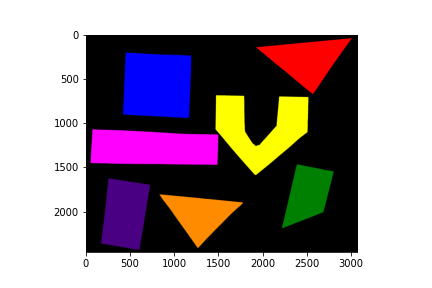

In [54]:
big_labeled_image_rgb = skimage.color.label2rgb(big_labeled_image, bg_label=0)
plot(big_labeled_image_rgb)

In [56]:
object_features = skimage.measure.regionprops(big_labeled_image)
len(object_features)

7

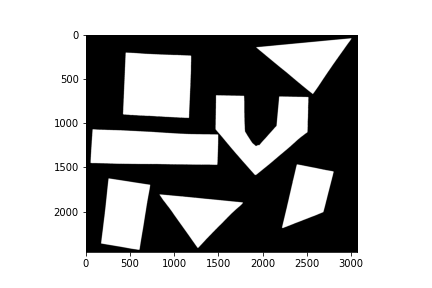

In [59]:
plot(skimage.morphology.remove_small_objects(binary_mask, min_size=1000))

In [64]:
binary_mask_clean = skimage.morphology.remove_small_objects(binary_mask, min_size=1000)
labeled_image_clean, count_clean = skimage.measure.label(binary_mask_clean, return_num=True, connectivity=1)
print(count_clean)

7
